 <h1><big><center>Exposure Fusion</center></big></h1>
 <h3><big><center><a href="https://github.com/souhaiel1"> Souhaiel Ben Salem</a></center></big></h3>


In this project, we present the implementation and investigation of a technique for
fusing a bracketed exposure sequence into a high-quality image, without the need
for physically-based HDR assembly. This technique, called ExposureF usion,
was introduced by [T. Mertens, J. Kautz , F](https://web.stanford.edu/class/cs231m/project-1/exposure-fusion.pdf)  . Their approach simplifies the
image acquisition process by skipping the HDR assembly step, and is computa-
tionally efficient and versatile enough to include flash images in the sequence.
The technique blends multiple exposures in a multi-resolution fashion, guided by
quality measures such as saturation and contrast. The resulting image quality is
comparable to existing tone mapping operators and demonstrates the potential of
our proposed method.

In [33]:
import argparse
import cv2 
import time
import os
import numpy as np
from prettytable import PrettyTable
import glob
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [35]:
class bcolors:
    HEADER = '\033[95m'
    OKBLUE = '\033[94m'
    OKCYAN = '\033[96m'
    OKGREEN = '\033[92m'
    WARNING = '\033[93m'
    FAIL = '\033[91m'
    ENDC = '\033[0m'
    BOLD = '\033[1m'
    UNDERLINE = '\033[4m'

### Parameters 

Here we set the parameters as defined by the authors in the Paper: 

- $W_c$ : weightin exponent for Contrast $C$

- $W_s$ : weightin exponent for Saturation $S$

- $W_e$ : weightin exponent for Well-Exposedness $E$


In [36]:
wc, ws, we = 1, 1, 1
sigma = 0.2 # for Gaussian curve

#### Image Sequences

We Examine the different scenes that we will operate on. For each scene, we have a sequence of bracketed exposures that will be eventually be fused to obtain the final HDR Image. 

In [37]:
def pretty_table(dct):
  table = PrettyTable()
  for c in dct.keys():
     table.add_column(c, [])
  table.add_row(['\n'.join(str(dct[c])) for c in dct.keys()])
  print(table)

In [38]:
folder =r'C:\Users\21655\Desktop\Numerical Imaging\Bracketed Sequences'
scenes = os.listdir(folder)
num_files =[]
for scene in scenes:
    num_files.append(len(os.listdir(folder + "/" + scene)))
bracketed_seq = {scenes[i]: num_files[i] for i in range(len(scenes))}
# Number of Images in the braceeted sequence for each scene
pretty_table(bracketed_seq)

+------------+-------+-------+-----------------+------+------------+--------+----------+--------+
| Agia Sofia | Blimp | Canon | cap de formento | Cave | Notre Dame | Ostrow | St Louis | Window |
+------------+-------+-------+-----------------+------+------------+--------+----------+--------+
|     1      |   3   |   3   |        3        |  4   |     5      |   3    |    4     |   1    |
|     1      |       |       |                 |      |            |        |          |   3    |
+------------+-------+-------+-----------------+------+------------+--------+----------+--------+


In [39]:
# Specifying the characteristics of each sequence of scene
Canon_seq = {1 : 'Underexposed (-2EV)', 2 : 'auto (0EV)', 3 : 'Overexposed (+2EV)'}
Ostrow_seq = {1 : 'Underexposed (-2EV)', 2 : 'auto (0EV)', 3 : 'Overexposed (+2EV)'}
Blimp_seq = {1 : 'Underexposed (-2EV)', 2 : 'auto (0EV)', 3 : 'Overexposed (+2EV)'}
cap_de_formento_seq = {1 : 'Underexposed (-2EV)', 2 : 'auto (0EV)', 3 : 'Overexposed (+2EV)'}
Cave_seq = {1 : 'Overexposed (+3EV)', 2 : 'auto (0EV)', 3 : 'Underexposed (-2EV)', 4 : 'Underexposed (-3EV)'}
Notre_Dame_seq = {1 : 'Underexposed (-1.33EV)', 2 : 'Underexposed (-0.67EV)', 3 : 'auto (0EV)', 4 : 'Overerexposed (+0.67EV)', 5 : 'Overerexposed (+1.33EV)'}
Agia_Sofia_seq = {1 : '+5EV', 2 : '+4EV', 3 : '+3EV', 4 : '+2EV', 5 : '+1EV' , 6 : '0EV', 7 : '-0.7EV' , 8 : '-1.4EV', 9 : '-2EV' , 10 : '-2.7EV' , 11 : '-4EV'}
st_lousi_seq = {1:'-4 stops', 2:'-2 stops', 3:'+2 stops',4:'+4 stops'}
scene_characteristics = [Canon_seq,Ostrow_seq,Blimp_seq,cap_de_formento_seq,Cave_seq,Notre_Dame_seq,Agia_Sofia_seq]

In [40]:
# General purpose function to show results
def show_sequence(scene,characteristics=None,plot_weight_maps=False):
    
    if type(scene) is str:
        images = []
        for img_path in glob.glob(folder+'/'+scene+'\*.jpg'):
            images.append(mpimg.imread(img_path))
    else: 
        images = scene
    plt.figure(figsize=(30,15))
    columns = len(images)
    for i, image in enumerate(images):
        im = images[i].squeeze()
        plt.subplot(len(images) // columns + 1, columns, i + 1)
        #plt.title(characteristics[characteristics.index(scene_seq)][i+1])
    
        if characteristics != None:
            if len(images) == len(characteristics.keys())  :      
                plt.title(characteristics[i+1]) 
            else : 
               characteristics[len(characteristics.keys())+1] = "result"
               plt.title(characteristics[i+1]) 
        if plot_weight_maps:
             plt.title('W' + str(i+1))       
                  
        plt.imshow(image,cmap='gray')


        plt.xticks([])
        
        #plt.yticks([])

##### Examples of the image sequences at hand

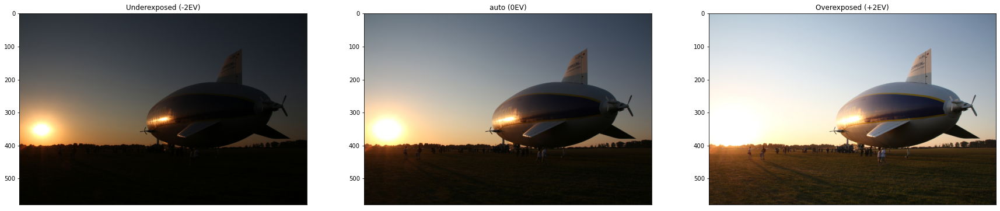

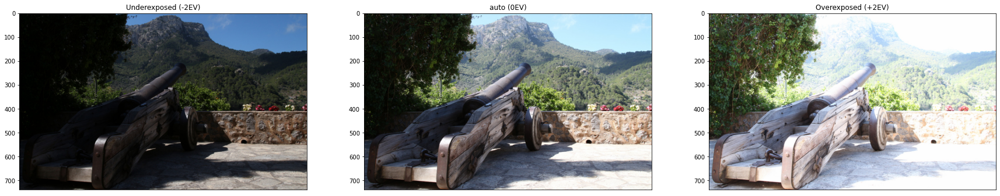

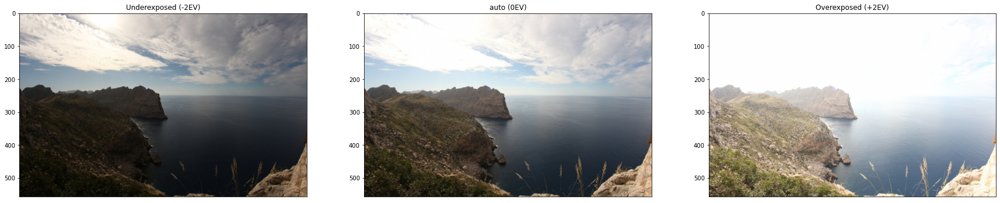

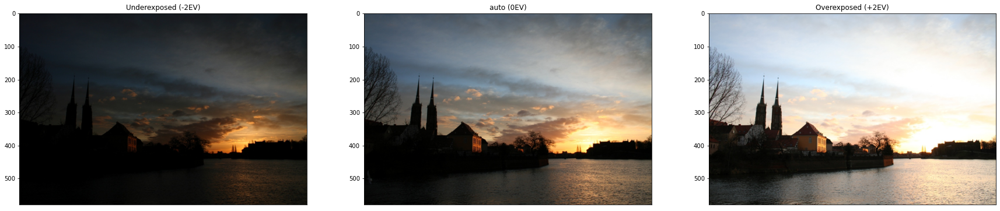

In [59]:
# Show examples (scenes with a sequence of 3 images)
scenes3 =[i for i in bracketed_seq.keys() if bracketed_seq[i] == 3 ]
seq3 = [i for i in scene_characteristics if len(i.keys()) ==3 ]
for exp in scenes3:
    show_sequence(exp,seq3[scenes3.index(exp)])

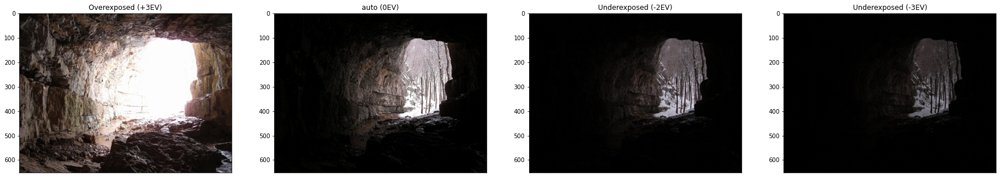

In [60]:
# Cave
show_sequence('Cave',Cave_seq)

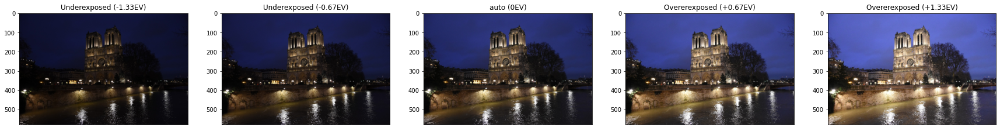

In [61]:
# Notre Dame de Paris
show_sequence('Notre Dame',Notre_Dame_seq)

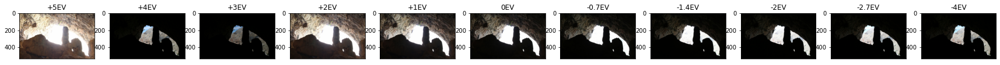

In [62]:
# Agia Sofia
show_sequence('Agia Sofia',Agia_Sofia_seq)

### Utility Functions

In this part we define some functions that will be used later for the task of exposure fusion.

In [41]:
def read_scene (scene):
    '''
    Takes in a scene and returns the normalized stack of the scene's Images I, the gray scale images
    and the properties of the scene (number of images , HxW, number of channels)
    '''
    img = np.array([cv2.imread(folder + "/" + scene + "/" + im) for im in os.listdir(folder + "/" + scene)])
    I = img[:,:,:,[2, 1, 0]]
    gray_images = np.array([cv2.cvtColor(im, cv2.COLOR_RGB2GRAY) for im in I])
    I = I / 255.0
    N, w, h, c = I.shape
    return I,gray_images,N, w, h, c

In [49]:
# Normalize between 0 and 1
def normalize(im):
	mi = im.min((0,1))
	ma = im.max((0,1))
	return (im - mi) / (ma - mi)

In [61]:
def plot_images(images, cmap='gray', clip=False):
	plt.figure(figsize=(15,12))
	n=len(images)
	for i in range(n):
		plt.subplot((n+1)//2,2,i+1)
		im = images[i].squeeze()
		cmap = 'gray' if len(im.shape)==2 else cmap
		plt.imshow(normalize(im) if clip else im,cmap='gray')
		plt.xticks([])
		plt.yticks([])
	plt.tight_layout(pad=0,h_pad=0,w_pad=0)
	plt.show()

The function below computes the quality measures and the weigh maps by which the exposure fusion process will be guided  as defined in the paper .

We compute: 

- **Contrast** : by applying a Laplacian filter to the grayscale version of each image and taking the absolute value of the filter response. This serves as a simple indicator for contrast and tends to assign a high weight to important elements such as edges and texture. 

- **Saturation** : Our saturation measure is computed as the standard deviation within the $R$, $G$ and $B$ channel, at each pixel.

- **Well-Exposedness** : We weight each intensity $i$ based on how close it is to $0.5$ using a Gauss curve: $e^{-\frac{(i-0.5)^2}{2\sigma^2}}$ 

- **Power Function** : We  control the influence of each measure using a power function defines as : $W_{ij,k} = \omega_C \times (C_{ij,k}) \times \omega_S \times (S_{ij,k}) \times \omega$

  Finally, we convert it to a weighted average to normalize the values of the $N$ weight maps : $\hat{W}{ij,k} = [ \sum_{k'=1}^N W_{ij,k'}]^{-1} W_{ij,k}$



In [43]:
def compute_weights(scene, save=False):
    I, gray_images, N = read_scene(scene)[:3]
    
    # Compute Contast
    C = abs(np.array([cv2.Laplacian(im, cv2.CV_16S, ksize=3) for im in gray_images])) 
    C = np.clip(C, 1e-6, None) # We clip to avid a division by 0

    # Compute Saturation
    S = np.sqrt(((I - np.expand_dims(I.sum(3), 3)) ** 2).sum(3)) 
    S = np.clip(S, 1e-6, None)
    
    # Compute Well Exposedness
    E = np.exp(-((I.mean(3) - 0.5)**2 / (2*sigma**2)))
    
    # Compute W using a Gaussian curve
    W = C**wc * S**ws * E**we 
    W /= W.sum(0)
    
    if save:
        for i in range(N):
            cv2.imwrite(f"results/{scene}_w{i}.jpg", 256 * W[i])
    
    return C, S, E, W

The below function plots images of a list of pyramids (`pyr`). The images are displayed vertically in order, with the first image being at the top and the last image being at the bottom. The function first checks if the number of channels of each image in the pyramid is 2 (grayscale) or not. If it's 2, the function adds a third dimension to make the image have 3 channels. The function then combines each image in the pyramid by stacking them vertically. If the clip argument is set to True, the function normalizes the image data before plotting it. Finally, the function calls plot_images with the combined images to display the pyramid. 

In [56]:
def plot_pyramids(pyr, clip=False):
	ims = []
	K = len(pyr)
	N = pyr[0].shape[0]
	sh = []
	if len(pyr[0][0].shape) == 2:
		for k in range(K):
			sh.append(pyr[k].shape)
			pyr[k] = np.expand_dims(pyr[k], 3)
	for i in range(N):
		w, h, c = pyr[0][i].shape
		w2 = w + pyr[1][i].shape[0]
		im = np.zeros((w2, h, c))
		im[:w,:h,:] = normalize(pyr[0][i]) if clip else pyr[0][i]
		x = 0
		for k in range(1, K):
			a, b, _ = pyr[k][i].shape
			im[-a:, x:x+b,:] = normalize(pyr[k][i]) if clip else pyr[k][i]
			x += b
		ims.append(im)
	if len(sh) > 0:
		for k in range(K):
			pyr[k] = pyr[k].reshape(sh[k])
	plot_images(ims)

## Various Fusion Techniques

### Naive Fusion

As described in the paper, the naive fusion technique consits of using a linear combination of each Image in the stack weighted by its corresponding weigh map. Each pixel in the ressulting image is  computed as follows: 

 $$R_{ij} = \sum_{k=1}^{N} {\hat{W}}_{ij,k} I_{ij,k}$$

 
with $I_k$ the $k-th$ input image in the sequence.

In [12]:
def naive_fusion(scene, plot_weight_maps=False, save=False, characteristics=None):
    '''
    Performs the exposure fusion in using a convex combination of the weight maps of quality measures (Naive Fusion)
    '''
    start_time = time.time()
    I,gray_images,N, w, h, c = read_scene(scene)
    W = compute_weights(scene, save=False)[-1]
    
    if plot_weight_maps:
        show_sequence(W, characteristics=None, plot_weight_maps=plot_weight_maps)
        
    R = (np.expand_dims(W, 3) * I).sum(0) # compute the resulting image
    
    ex_time = time.time() - start_time
    if save:
        for i in range(N):
            file_pathw = "results/" + scene + "_naive_w"+str(i)+".jpg"
            cv2.imwrite(file_pathw, 256 * W[i])
        file_path = "results/" + scene + "_naive.jpg"
        cv2.imwrite(file_path, 256 * R[:, :, [2, 1, 0]])
    print(f'{bcolors.BOLD}{bcolors.OKGREEN} ---> Input sequence of {N} images of shape ({w}x{h}x{c})')
    print(f'{bcolors.BOLD}{bcolors.OKGREEN} ---> The operation took {ex_time} seconds to complete\n') 

    show_sequence(np.concatenate((I, [R])), characteristics)

Applyin the previous method produces an unsatisfactory result. Wherever weights vary quickly, disturbing seams will appear.  This happens because the images we are combining, contain different absolute intensities due to their
different exposure times. Which leads us to trying other techniques in an attempt to discard those seams. The first idea that comes t mind is using smoothing filters.

### Gaussian

The first attempt to get rid of the seams is carried out using a simple gaussian smoothing operation accross the weight maps. The idea is that we could avoid sharp weight map transitions by smoothing the weight map with a Gaussian filter.

**Brief Description of the function** : 

This function performs Gaussian smoothing on the weigh maps. The function has three parameters : 

- `scene`: a string representing the scene name. The scene image sequence is loaded using the `read_scene` function. 

- `plot_weigh_maps` : a Boolean flag that determines whether to plot the weights

- `save`: a Boolean flag that determines whether to save the filtered final result image.


The function first loads the multi-channel image I by calling the read_scene function and extracts the first element of the returned list. The function then calls the compute_weights function to obtain the weights `W` of the scene, which is a 3-dimensional array representing the weights for each pixel in the image.

Next, the function applies Gaussian smoothing to each channel of the image by using the `cv2.GaussianBlur` function. This function uses a Gaussian kernel with a size of `(3,3)` and standard deviation of `3` to perform the smoothing. The smoothed weights are stored by updating the `W` array. <br>
Finally, the function computes the filtered image `R` by taking the weighted sum of the multi-channel image I and the smoothed weights `W` over the number of channels. The filtered image is then concatenated with the original image `I` using `np.concatenate((I, [R]))` and passed to the `plot_images` function to display the original and filtered images side-by-side for comparison.


In [13]:
def gaussian_smoothing(scene, plot_weight_maps=False, save=False,characteristics=None):
	'''
    Performs the exposure fusion in using a convex combination of the weight maps of quality measures after being smoothed by a Gaussian filter to remove seams.
    '''
	start_time = time.time()
	I,gray_images,N, w, h, c = read_scene(scene)
	W = compute_weights(scene, save=False)[-1]   
	W_smoothed = np.array([cv2.GaussianBlur(w_i, (9,9), 5) for w_i in W])
	
	if plot_weight_maps:
		show_sequence(W_smoothed, characteristics=None, plot_weight_maps=plot_weight_maps)
	R = (np.expand_dims(W_smoothed, 3)*I).sum(0)

	ex_time = time.time() - start_time
	if save:
		for i in range(N):
			file_pathw = "results/" + scene + "_gauss_w"+str(i)+".jpg"
			cv2.imwrite(file_pathw, 256 * W_smoothed[i])
		cv2.imwrite("results/" + scene + "_gauss.jpg", 256*R[:,:,[2,1,0]])
	print(f'{bcolors.BOLD}{bcolors.OKGREEN} ---> Input sequence of {N} images of shape ({w}x{h}x{c})\n')
	print(f'{bcolors.BOLD}{bcolors.OKGREEN} ---> The operation took {ex_time} seconds to complete\n') 
	show_sequence(np.concatenate((I, [R])),characteristics)

### Cross-Bilateral 

The results obtained using the Gaussian-smoothed wight maps present undesirable halos around edges, and spills information across object boundaries. This is why the natural next idea to try is an edge-aware smoothing operation using  a non-linear filter, like the cross-bilateral filter for example. This filter takes into account both the spatial and intensity-based properties of the neighborhood of a pixel which helps retining the edges.

**Brief Description of the function** : 

This function is implementing a cross-bilateral filtering algorithm on an input image. The input Image is first processed by the `read_scene` function to extract the image data, the grayscale images, the number of images `N`, and the image width `w` and height `h`.

Then, the `compute_weights` function is called  to compute the weights. The variable `W` is then assigned to the last element of the returned value from `compute_weights`.

The function then sets the parameters `sx`, `sc`, and `sk` for the filtering process. It calculates a 2-dimensional Gaussian filter `dx` with `sk` standard deviation.

Next, the function iterates over all pixels in the image, skipping `sk` pixels from the border. For each pixel, the function extracts a patch around the pixel and computes a color-based weight `dc` using a Gaussian function with `sc` standard deviation. The weights `dx` and `dc` are combined and normalized to form the final weight coeff for the pixel. The weighted average of the patch is then computed and stored in `W_cross_bil`.

The filtered image `R` is then computed by summing the product of the image and `W_cross_bil` over the number of images. 



In [14]:
def cross_bilateral_denoising(scene,save=False,characteristics=None,plot_weight_maps=False):
	'''
    Performs the exposure fusion in using a convex combination of the weight maps of quality measures after being smoothed by a Cross-Bilateral filter to remove seams.
    '''
	start_time = time.time()
	I,gray_images,N, w, h, c = read_scene(scene)
	W = compute_weights(scene, save=False)[-1] 
	std_spat, std_color, patch_size = 5, 0.3,6 

	dx = np.array([[(-patch_size+i)**2 + (-patch_size+j)**2 for j in range(2*patch_size+1)] for i in range(2*patch_size+1)])
	dx = np.exp(- 0.5 * dx / std_spat**2)
	W_cross_bil = W.copy()
	num_imgs = len(I)
	for i in tqdm(range(patch_size, w-patch_size)):
		for j in range(patch_size, h-patch_size):
			patch = W[:, i-patch_size:i+patch_size+1, j-patch_size:j+patch_size+1] 
			dc = np.exp(- 0.5 * np.linalg.norm(I[:, i-patch_size:i+patch_size+1, j-patch_size:j+patch_size+1] - I[:,i,j].reshape((num_imgs,1,1,3)), axis=3)**2 / std_color**2)
			coeff = dx*dc
			coeff /= coeff.sum((1,2), keepdims=True)
			W_cross_bil[:,i,j] = (patch * coeff).sum((1,2)) + 1e-6

	W_cross_bil /= W_cross_bil.sum(0)

	if plot_weight_maps:
		show_sequence(W_cross_bil, characteristics=None, plot_weight_maps=plot_weight_maps)

	R = (np.expand_dims(W_cross_bil, 3)*I).sum(0)
	
	ex_time = time.time() - start_time
	if save:
		for i in range(N):
			file_pathw = "results/" + scene + "_cross_bilateral_w"+str(i)+".jpg"
			cv2.imwrite(file_pathw, 256 * W_cross_bil[i])	
		cv2.imwrite("results/" + scene + "_cross_bilateral.jpg", 256*R[:,:,[2,1,0]])
		
	print(f'{bcolors.BOLD}{bcolors.OKGREEN} ---> Input sequence of {N} images of shape ({w}x{h}x{c})\n')
	print(f'{bcolors.BOLD}{bcolors.OKGREEN} ---> The operation took {ex_time} seconds to complete\n') 	
	show_sequence(np.concatenate((I, [R])),characteristics)

### Laplacian Pyramid


Given that the smoothing techniques did not yield satisfactory results, the author decided to opt for a more sophisticated fusion technique using a `Laplacian Pyramid`

**Brief Description of the function** : 

The function Below  performs performs a `Laplacian pyramid` based fusion.

1- It first reads a `scene` and computes the `weights` (output of `read_scene` and c`ompute_weights` functions).

2- It then constructs a Gaussian pyramid of both the scene and weights by repeatedly downsampling using `cv2.pyrDown` until the minimum dimension is `2`.

3- It then creates  Laplacian pyramid of the Gaussian pyramid of the scene by subtracting each level of the upsampled Gaussian pyramid from the next lower resolution level.

4- It creates another pyramid `(layer_resps)` by element-wise multiplying the Gaussian pyramid of the weights and the Laplacian pyramid of the scene.

5- The final result `(R)` is reconstructed from the bottom up by adding each level of the `Layer responses`.

6- The final result is clipped between 0 and 1 to ensure pixel values are within valid range.

Finally, the original scene and final result are plotted.

In [68]:
def Laplacian_pyramid(scene, plot=False, save=False,characteristics=None):


	start_time = time.time()
	I,gray_images,N, w, h, c = read_scene(scene)
	W = compute_weights(scene, save=False)[-1] 
		
	I_pyr, W_pyr = [I], [W]
	while min(W_pyr[-1].shape[1], W_pyr[-1].shape[2]) > 5:
		W_pyr.append(np.array([cv2.pyrDown(w) for w in W_pyr[-1]]))
		I_pyr.append(np.array([cv2.pyrDown(im) for im in I_pyr[-1]]))

	if plot:
		plot_pyramids(W_pyr)
		plot_pyramids(I_pyr)

	Laplacian_pyrms = [] # list of laplacian pyramids
	for l in range(len(I_pyr)-1):
		lap_up = []
		for n in range(N):
			upsampled_image = cv2.pyrUp(I_pyr[l+1][n], dstsize=(I_pyr[l][n].shape[1], I_pyr[l][n].shape[0]))
			lap_up.append(upsampled_image)
		lap_up = np.array(lap_up)		
		Laplacian_pyrms.append(I_pyr[l] - lap_up) # add Laplacian levelvto the pyramid
	Laplacian_pyrms.append(I_pyr[-1])
	if plot: plot_pyramids(Laplacian_pyrms, clip=True)


	layer_resps = [] # layer responses
	for l in range(len(W_pyr)):
		layer_resps.append((np.expand_dims(W_pyr[l], 3) * Laplacian_pyrms[l]).sum(0))

	if plot: plot_pyramids([np.expand_dims(lr, 0) for lr in layer_resps], clip=True)
	R = layer_resps[-1]
	# reconstruction
	for l in range(2, len(layer_resps)+1):
		r_up = cv2.pyrUp(R, dstsize=(layer_resps[-l].shape[1], layer_resps[-l].shape[0]))
		R = r_up + layer_resps[-l]
	R = np.clip(R, 0, 1)

	ex_time = time.time() - start_time
	if save:
		cv2.imwrite("results/" + scene + "LP_res"+".jpg", 256*R[:,:,[2,1,0]])

	print(f'{bcolors.BOLD}{bcolors.OKGREEN} ---> Input sequence of {N} images of shape ({w}x{h}x{c})\n')
	print(f'{bcolors.BOLD}{bcolors.OKGREEN} ---> The operation took {ex_time} seconds to complete\n') 
	show_sequence(np.concatenate((I, [R]), 0),characteristics)

## Experiments

#### Sequence before fusion : 

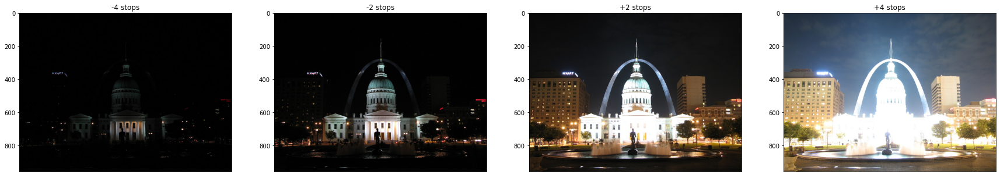

In [105]:
show_sequence('St Louis',st_lousi_seq)

### Naive Fusion

 ---> Input sequence of 4 images of shape (960x1280x3)
 ---> The operation took 0.8364441394805908 seconds to complete



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


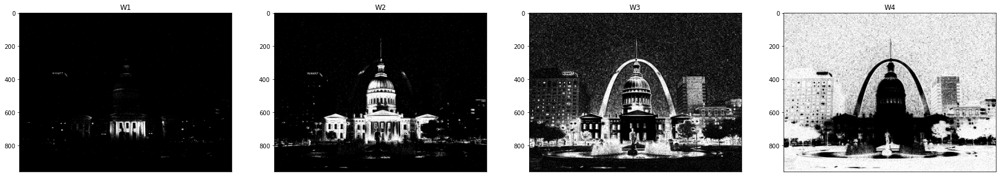

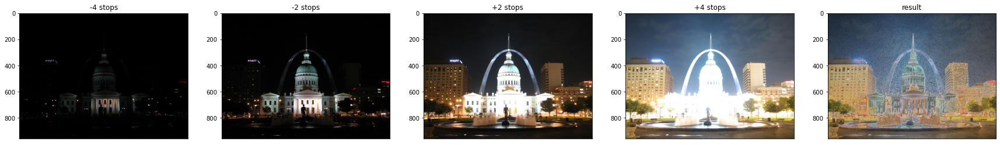

In [106]:
naive_fusion('St Louis', plot_weight_maps=True, save=True,characteristics=st_lousi_seq)

### Post-Gaussian-Smoothing Fusion

 ---> Input sequence of 4 images of shape (960x1280x3)

 ---> The operation took 0.9333651065826416 seconds to complete



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


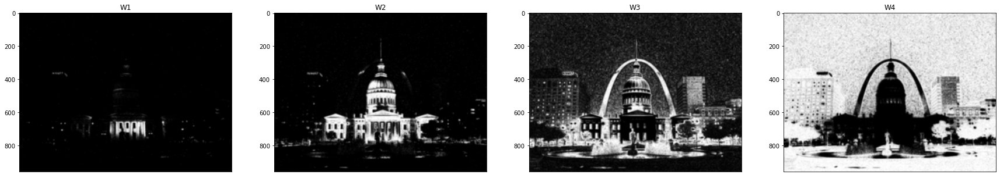

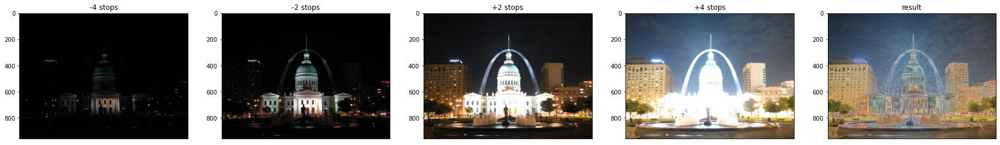

In [107]:
gaussian_smoothing('St Louis', plot_weight_maps=True, save=True,characteristics=st_lousi_seq)

### Cross-Bilateral base Fusion

100%|██████████| 948/948 [03:00<00:00,  5.25it/s]


 ---> Input sequence of 4 images of shape (960x1280x3)

 ---> The operation took 181.82363772392273 seconds to complete



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


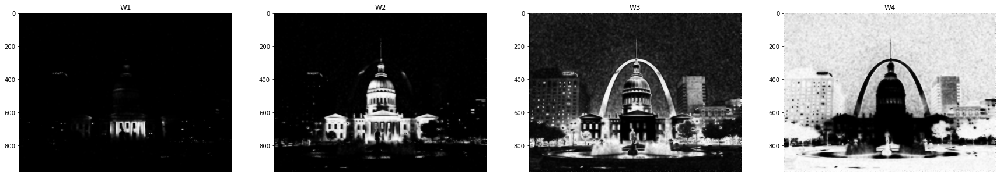

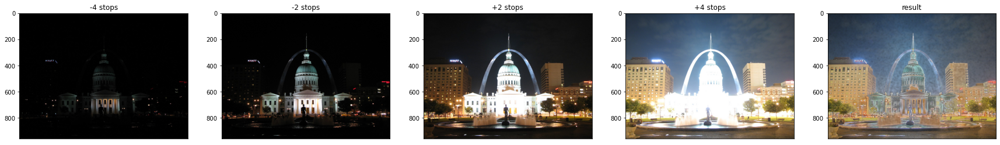

In [51]:
cross_bilateral_denoising('St Louis',save=True,characteristics=st_lousi_seq,plot_weight_maps=True)

#### Using the final algorithm: Multi-Scale Exposure Fusion

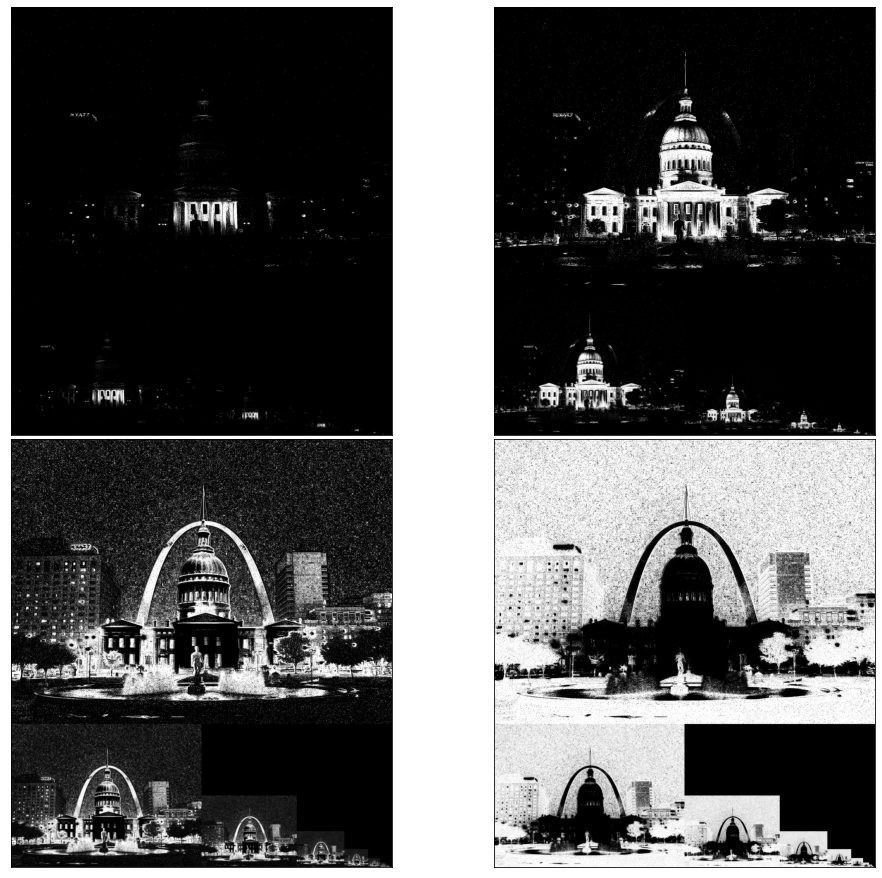

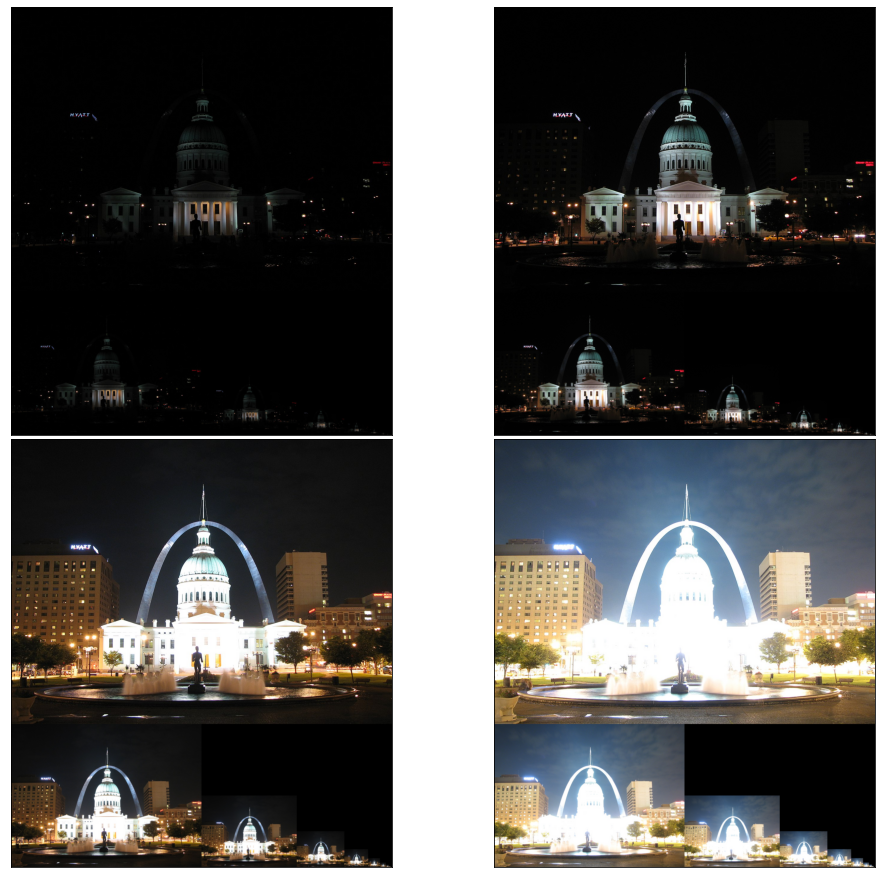

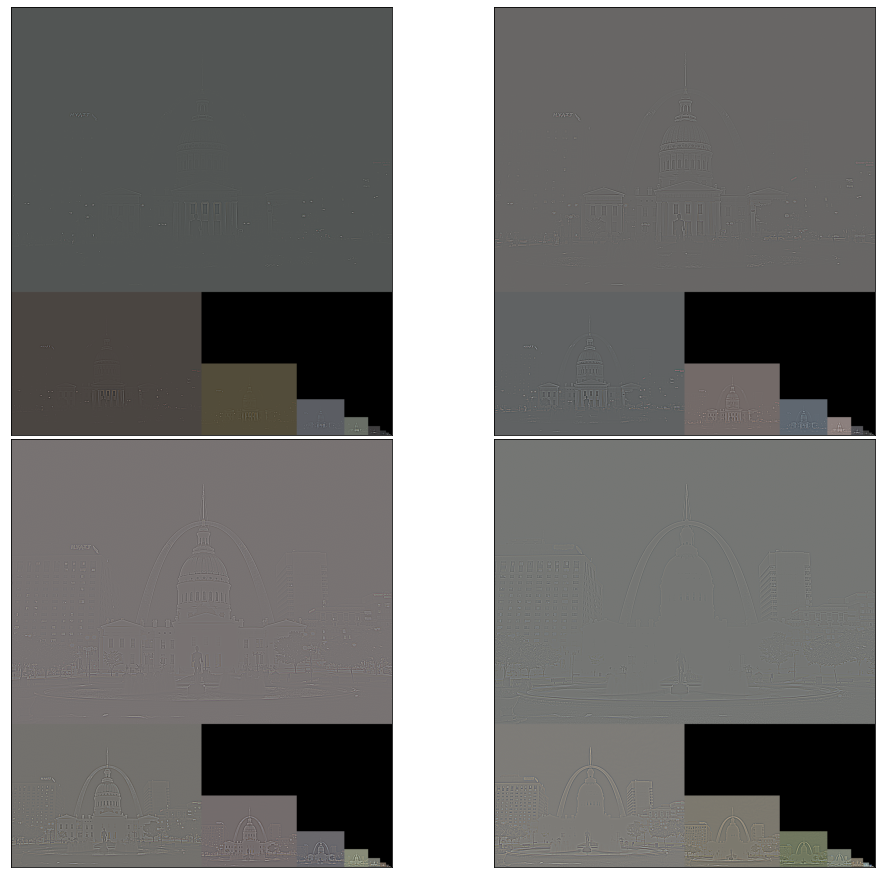

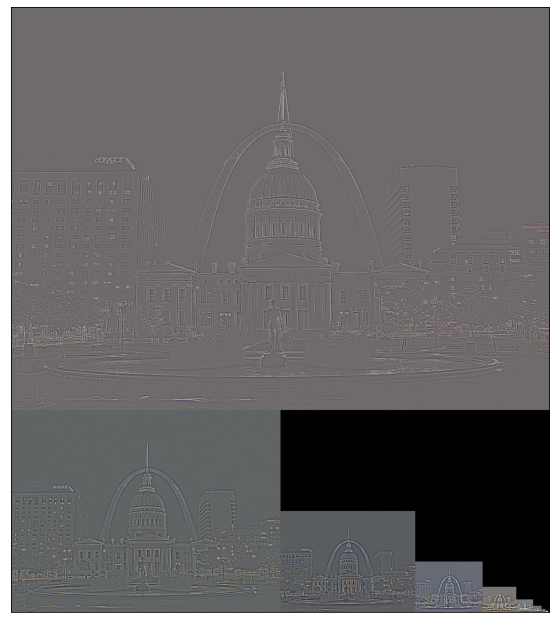

 ---> Input sequence of 4 images of shape (960x1280x3)

 ---> The operation took 7.662197113037109 seconds to complete



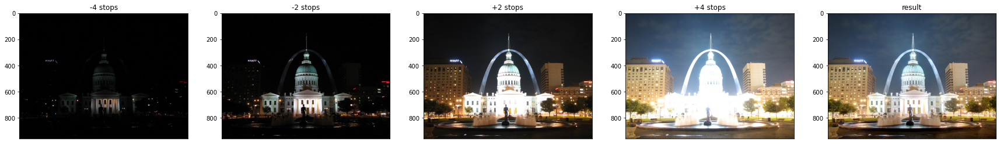

In [70]:
Laplacian_pyramid('St Louis',plot=True, save=True,characteristics=st_lousi_seq)

 ---> Input sequence of 4 images of shape (653x870x3)

 ---> The operation took 0.591245174407959 seconds to complete



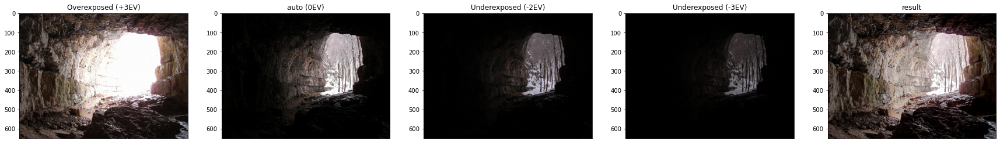

In [96]:
Laplacian_pyramid('Cave',plot=False, save=True,characteristics=Cave_seq)

 ---> Input sequence of 11 images of shape (535x870x3)

 ---> The operation took 1.2803044319152832 seconds to complete



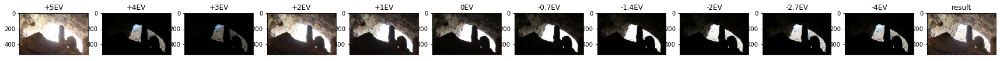

In [97]:
Laplacian_pyramid('Agia Sofia',plot=False, save=True,characteristics=Agia_Sofia_seq)

 ---> Input sequence of 3 images of shape (740x1200x3)

 ---> The operation took 0.6803576946258545 seconds to complete



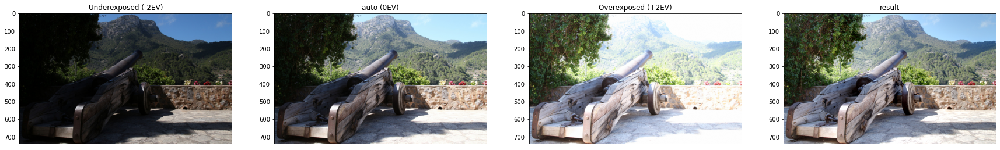

In [98]:
Laplacian_pyramid('Canon',plot=False, save=True,characteristics=Canon_seq)

 ---> Input sequence of 3 images of shape (580x870x3)

 ---> The operation took 0.3849599361419678 seconds to complete



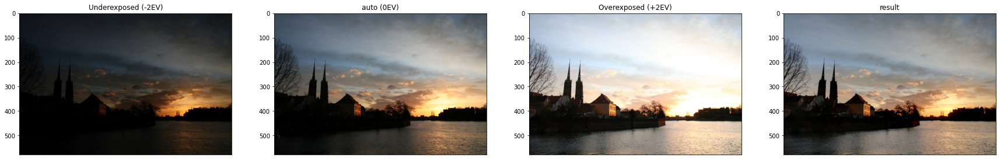

In [99]:
Laplacian_pyramid('Ostrow',plot=False, save=True,characteristics=Ostrow_seq)

 ---> Input sequence of 3 images of shape (580x870x3)

 ---> The operation took 0.3872368335723877 seconds to complete



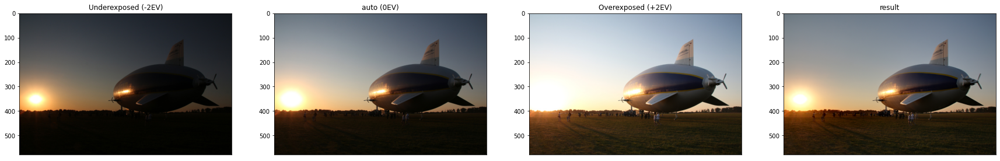

In [100]:
Laplacian_pyramid('Blimp',plot=False, save=True,characteristics=Blimp_seq)

 ---> Input sequence of 3 images of shape (558x870x3)

 ---> The operation took 0.40503621101379395 seconds to complete



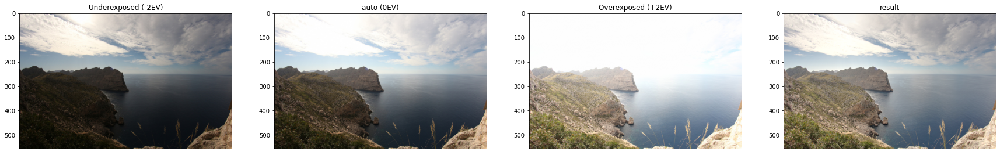

In [101]:
Laplacian_pyramid('Cap de Formento',plot=False, save=True,characteristics=cap_de_formento_seq)

 ---> Input sequence of 5 images of shape (580x870x3)

 ---> The operation took 0.6245920658111572 seconds to complete



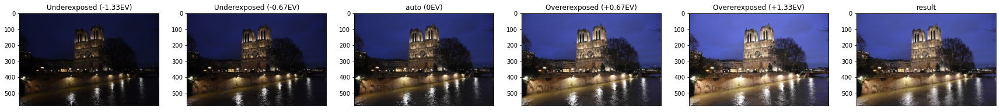

In [102]:
Laplacian_pyramid('Notre Dame',plot=False, save=True,characteristics=Notre_Dame_seq)

 ---> Input sequence of 11 images of shape (535x870x3)

 ---> The operation took 1.2400014400482178 seconds to complete



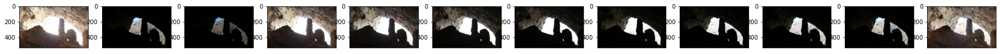

In [103]:
Laplacian_pyramid('Agia Sofia',plot=False, save=True,characteristics=None)

 ---> Input sequence of 13 images of shape (960x1280x3)

 ---> The operation took 4.505802392959595 seconds to complete



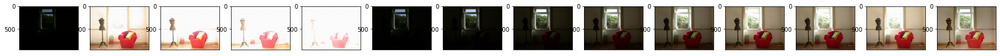

In [104]:
Laplacian_pyramid('Window',plot=False, save=True,characteristics=None)